# Inspecting entire dataset

In [22]:

import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

complex_labels = {
    "complex_i": "Complex I",
    "complex_ii": "Complex II",
    "complex_iii": "Complex III",
    "complex_iv": "Complex IV",
    "complex_v": "Complex V"
}


STRING_DIR = "../data/interim/STRING_output"

subtypes = [
    "classical",
    "mesenchymal",
    "proneural"
]

PATHWAY_DIR = "../data/processed/pathway_diff"
OXPHOS_DIR = "../data/processed/oxphos"

pathways = [
    "Apoptosis",
    "Autophagy",
    "Ferroptosis",
    "Necroptosis",
    "Pyroptosis"
]

complexes = [
    "complex_i",
    "complex_ii",
    "complex_iii",
    "complex_iv",
    "complex_v"
]

graphs = {}



for subtype in subtypes:

    from collections import defaultdict

    gene_annotation = defaultdict(lambda: {
        "pathways": set(),
        "complexes": set()
    })
    
    gene_log2fc = {}
    ####################################################
    # Load pathway annotations
    ####################################################
    
    for pathway in pathways:

        file = os.path.join(
            PATHWAY_DIR,
            subtype,
            f"{subtype}_{pathway}_diff.csv"
        )

        df = pd.read_csv(file, index_col=0)

        df.index = df.index.astype(str).str.upper()

        for gene in df.index:

            gene_annotation[gene]["pathways"].add(pathway)

            # store log2FC
            gene_log2fc[gene] = df.loc[gene, "log2FC_rna"]
    ####################################################
    # Load complex annotations
    ####################################################

    for complex_name in complexes:

        file = os.path.join(
            OXPHOS_DIR,
            subtype,
            f"{subtype}_{complex_name}.csv"
        )

        df = pd.read_csv(file, index_col=0)

        df.index = df.index.astype(str).str.upper()

        for gene in df.index:
            gene_annotation[gene]["complexes"].add(
                complex_labels[complex_name]
            )

        for gene in df.index:

                gene_annotation[gene]["complexes"].add(
                    complex_labels[complex_name]
                )

                # also store log2FC for complex genes
                gene_log2fc[gene] = df.loc[gene, "log2FC_rna"]

    ####################################################
    # Load STRING network
    ####################################################

    file = os.path.join(
        STRING_DIR,
        f"{subtype}_string_interactions.tsv"
    )

    interactions = pd.read_csv(
        file,
        sep="\t"
    )

    G = nx.from_pandas_edgelist(
        interactions,
        source="#node1",
        target="node2",
        edge_attr=True,
        create_using=nx.Graph()
    )

    graphs[subtype] = G

    for gene in G.nodes():

        G.nodes[gene]["Pathways"] = list(
            gene_annotation[gene]["pathways"]
        )

        G.nodes[gene]["Complexes"] = list(
            gene_annotation[gene]["complexes"]
        )

        G.nodes[gene]["log2FC"] = gene_log2fc.get(gene, 0)

    annotation = []

    for gene in G.nodes():

        annotation.append({

            "Gene": gene,

            "Pathways": ";".join(G.nodes[gene]["Pathways"]),

            "Complexes": ";".join(G.nodes[gene]["Complexes"])

        })

    annotation = pd.DataFrame(annotation)

    annotation.to_csv(
        f"../data/interim/network_stat/{subtype}/{subtype}_annotations.csv",
        index=False
    )
    

    
    degree = dict(G.degree())
    betweenness = nx.betweenness_centrality(G)
    closeness = nx.closeness_centrality(G)
    pagerank = nx.pagerank(G)

    stats = pd.DataFrame({
        "Gene": list(G.nodes()),
        "Degree": [degree[g] for g in G.nodes()],
        "Betweenness": [betweenness[g] for g in G.nodes()],
        "Closeness": [closeness[g] for g in G.nodes()],
        "PageRank": [pagerank[g] for g in G.nodes()]
    })

    stats.sort_values(
        "Degree",
        ascending=False
    ).to_csv(
        os.path.join(

            f"../data/interim/network_stat/{subtype}/{subtype}_network_statistics.csv"
        ),
        index=False
    )
    print(f"{subtype.capitalize()}")
    print(f"Nodes : {G.number_of_nodes()}")
    print(f"Edges : {G.number_of_edges()}")
    print("-" * 30)


Classical
Nodes : 218
Edges : 5288
------------------------------
Mesenchymal
Nodes : 240
Edges : 5544
------------------------------
Proneural
Nodes : 203
Edges : 4989
------------------------------


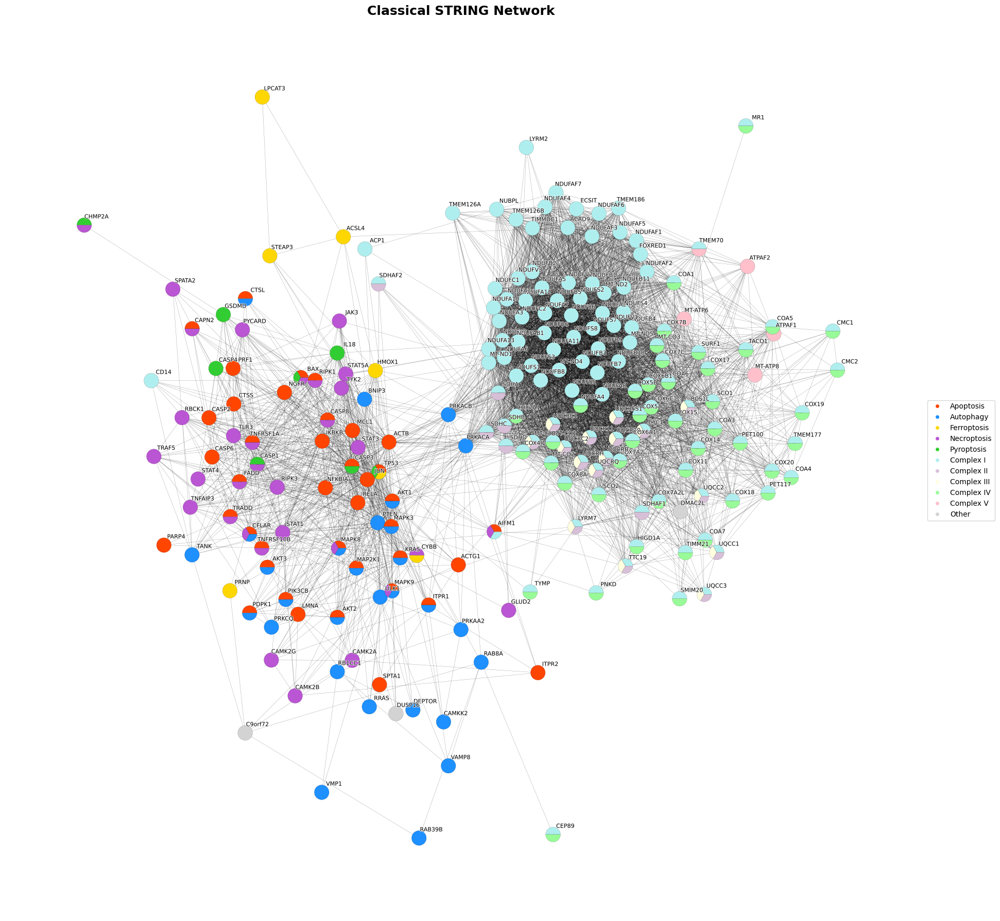

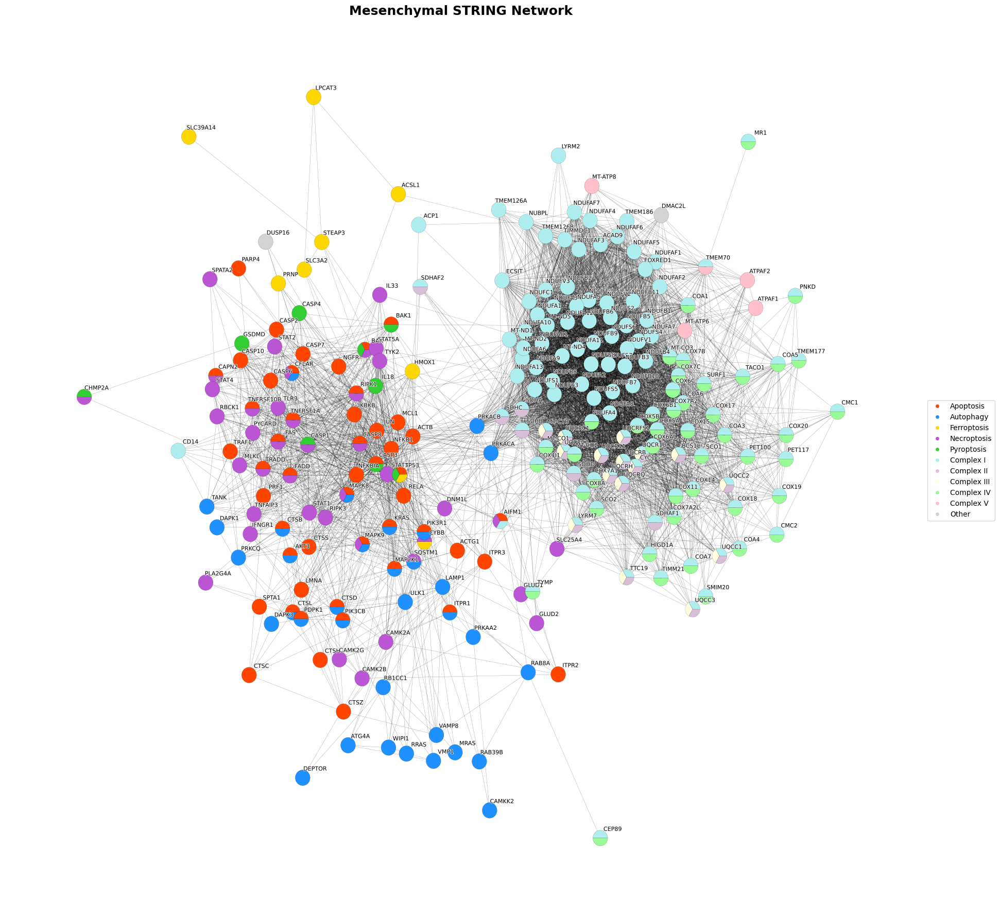

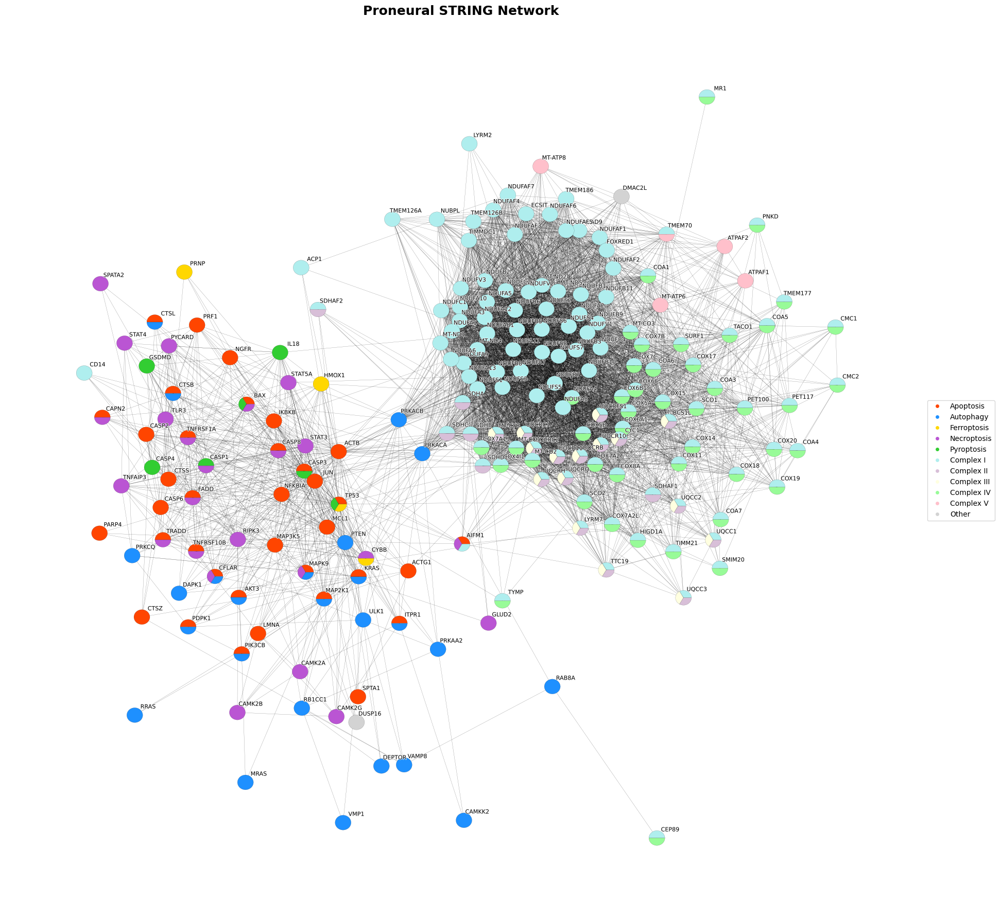

In [23]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.patheffects as pe
from matplotlib.patches import Wedge, Circle
from matplotlib.lines import Line2D

# --------------------------------------------------
# COLORS
# --------------------------------------------------

pathway_colors = {
    "Apoptosis": "orangered",
    "Autophagy": "dodgerblue",
    "Ferroptosis": "gold",
    "Necroptosis": "mediumorchid",
    "Pyroptosis": "limegreen"
}

complex_colors = {
    "Complex I": "paleturquoise",
    "Complex II": "thistle",
    "Complex III": "lightyellow",
    "Complex IV": "palegreen",
    "Complex V": "pink"
}

radius = 0.018

# --------------------------------------------------
# LOOP THROUGH SUBTYPES
# --------------------------------------------------

for subtype in subtypes:

    G = graphs[subtype]

    pos = nx.kamada_kawai_layout(G)

    fig, ax = plt.subplots(
        figsize=(18,18)
    )

    ##################################################
    # Draw edges
    ##################################################

    nx.draw_networkx_edges(
        G,
        pos,
        edge_color="black",
        width=0.2,
        alpha=0.6,
        ax=ax
    )

    ##################################################
    # Draw nodes
    ##################################################

    for gene in G.nodes():

        x, y = pos[gene]

        colors = []

        # -------- Pathways --------

        for pathway in G.nodes[gene]["Pathways"]:

            if pathway in pathway_colors:

                colors.append(
                    pathway_colors[pathway]
                )

        # -------- Complexes --------

        for comp in G.nodes[gene]["Complexes"]:

            if comp in complex_colors:

                colors.append(
                    complex_colors[comp]
                )

        # -------- Draw --------

        if len(colors) == 0:

            node = Circle(
                (x,y),
                radius,
                facecolor="lightgray",
                edgecolor="black",
                linewidth=0.1
            )

            ax.add_patch(node)

        elif len(colors) == 1:

            node = Circle(
                (x,y),
                radius,
                facecolor=colors[0],
                edgecolor="black",
                linewidth=0.1
            )

            ax.add_patch(node)

        else:

            angle = 360 / len(colors)

            for i, color in enumerate(colors):

                wedge = Wedge(
                    (x,y),
                    radius,
                    theta1=i*angle,
                    theta2=(i+1)*angle,
                    facecolor=color,
                    edgecolor="black",
                    linewidth=0.1
                )

                ax.add_patch(wedge)

    ##################################################
    # Labels
    ##################################################

    label_pos = {
        gene:
        (
            xy[0] + 0.03,
            xy[1] + 0.02
        )
        for gene, xy in pos.items()
    }

    texts = nx.draw_networkx_labels(
        G,
        label_pos,
        labels={g:g for g in G.nodes()},
        font_size=8,
        font_color="black",
        font_family="sans-serif",
        ax=ax
    )

    for t in texts.values():

        t.set_path_effects([
            pe.Stroke(
                linewidth=1.2,
                foreground="white"
            ),
            pe.Normal()
        ])

    ##################################################
    # Legend
    ##################################################

    legend = [

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=pathway_colors["Apoptosis"],
            label="Apoptosis"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=pathway_colors["Autophagy"],
            label="Autophagy"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=pathway_colors["Ferroptosis"],
            label="Ferroptosis"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=pathway_colors["Necroptosis"],
            label="Necroptosis"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=pathway_colors["Pyroptosis"],
            label="Pyroptosis"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=complex_colors["Complex I"],
            label="Complex I"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=complex_colors["Complex II"],
            label="Complex II"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=complex_colors["Complex III"],
            label="Complex III"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=complex_colors["Complex IV"],
            label="Complex IV"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor=complex_colors["Complex V"],
            label="Complex V"
        ),

        Line2D(
            [0],[0],
            marker='o',
            color='w',
            markerfacecolor="lightgray",
            label="Other"
        )

    ]

    fig.legend(
        handles=legend,
        loc="center right",
        bbox_to_anchor=(1.08,0.5)
    )

    ##################################################
    # Finish
    ##################################################

    ax.set_title(
        f"{subtype.capitalize()} STRING Network",
        fontsize=18,
        fontweight="bold"
    )

    ax.axis("off")

    plt.tight_layout()

    plt.savefig(
        f"../data/interim/network_stat/{subtype}/{subtype}_network.svg",
        format="svg",
        bbox_inches="tight"
    )

    plt.show()


In [24]:
#EDGE COUNT - INTERNAL OVERLAP

import pandas as pd

complex_order = [
    "Complex I",
    "Complex II",
    "Complex III",
    "Complex IV",
    "Complex V"
]

for subtype in subtypes:

    G = graphs[subtype]

    rows = []

    for pathway in pathways:

        row = {
            "Pathway": pathway
        }

        for complex_name in complex_order:

            count = 0

            for u, v in G.edges():

                u_path = pathway in G.nodes[u]["Pathways"]
                v_path = pathway in G.nodes[v]["Pathways"]

                u_comp = complex_name in G.nodes[u]["Complexes"]
                v_comp = complex_name in G.nodes[v]["Complexes"]

                # Count edge if at least one endpoint
                # belongs to pathway AND
                # at least one endpoint belongs to complex
                if (u_path or v_path) and (u_comp or v_comp):

                    count += 1

            row[complex_name] = count

        rows.append(row)

    table = pd.DataFrame(rows)

    print(f"\n{subtype.upper()} Edge Count")
    print(table)

    table.to_csv(
        f"../data/interim/network_stat/{subtype}/{subtype}_complex_pathway_edge_counts.csv",
        index=False
    )


CLASSICAL Edge Count
       Pathway  Complex I  Complex II  Complex III  Complex IV  Complex V
0    Apoptosis         71          29            9          17          0
1    Autophagy        103          13            3           7          0
2  Ferroptosis         12           5            1           5          0
3  Necroptosis         34          10            6           5          0
4   Pyroptosis         14           5            0           4          0

MESENCHYMAL Edge Count
       Pathway  Complex I  Complex II  Complex III  Complex IV  Complex V
0    Apoptosis         73          26            8          16          0
1    Autophagy         90           4            2           5          0
2  Ferroptosis         12           5            1           5          0
3  Necroptosis         65          21           13          20          0
4   Pyroptosis         16           5            0           4          0

PRONEURAL Edge Count
       Pathway  Complex I  Complex II  Compl

In [25]:
#EDGE COUNT - NO INTERNAL OVERLAP
complex_order = [
    "Complex I",
    "Complex II",
    "Complex III",
    "Complex IV",
    "Complex V"
]

for subtype in subtypes:

    G = graphs[subtype]

    rows = []

    for pathway in pathways:

        row = {"Pathway": pathway}

        for complex_name in complex_order:

            count = 0

            for u, v in G.edges():

                u_path = pathway in G.nodes[u]["Pathways"]
                v_path = pathway in G.nodes[v]["Pathways"]

                u_comp = complex_name in G.nodes[u]["Complexes"]
                v_comp = complex_name in G.nodes[v]["Complexes"]

                # Count ONLY cross-talk edges
                if (u_path and v_comp) or (v_path and u_comp):
                    count += 1

            row[complex_name] = count

        rows.append(row)

    table = pd.DataFrame(rows)

    print(f"\n{subtype.upper()} Edge Count (no internal overlap)")
    print(table)

    table.to_csv(
        f"../data/interim/network_stat/{subtype}/{subtype}_complex_pathway_edge_counts_no_overlap.csv",
        index=False
    )


CLASSICAL Edge Count (no internal overlap)
       Pathway  Complex I  Complex II  Complex III  Complex IV  Complex V
0    Apoptosis         70          29            9          17          0
1    Autophagy        103          13            3           7          0
2  Ferroptosis         12           5            1           5          0
3  Necroptosis         32          10            6           5          0
4   Pyroptosis         14           5            0           4          0

MESENCHYMAL Edge Count (no internal overlap)
       Pathway  Complex I  Complex II  Complex III  Complex IV  Complex V
0    Apoptosis         71          26            8          16          0
1    Autophagy         90           4            2           5          0
2  Ferroptosis         12           5            1           5          0
3  Necroptosis         62          21           13          20          0
4   Pyroptosis         16           5            0           4          0

PRONEURAL Edge Count 

In [29]:
import os
import pandas as pd
import matplotlib.pyplot as plt

complex_order = [
    "Complex I",
    "Complex II",
    "Complex III",
    "Complex IV",
    "Complex V"
]

complex_colors = {
    "Complex I": "paleturquoise",
    "Complex II": "thistle",
    "Complex III": "lightyellow",
    "Complex IV": "palegreen",
    "Complex V": "pink"
}

for subtype in subtypes:

    G = graphs[subtype]

    for pathway in pathways:

        pathway_nodes = [
            gene
            for gene in G.nodes()
            if (
                pathway in G.nodes[gene]["Pathways"]
                or G.nodes[gene]["Complexes"]
            )
        ]

        counts = []

        for complex_name in complex_order:
            count = sum(
                complex_name in G.nodes[gene]["Complexes"]
                for gene in pathway_nodes
            )
            counts.append(count)

        table = pd.DataFrame({
            "Complex": complex_order,
            "GeneCount": counts
        })

        fig, ax = plt.subplots(figsize=(8, 5))

        bars = ax.bar(
            table["Complex"],
            table["GeneCount"],
            color=[complex_colors[c] for c in table["Complex"]],
            edgecolor="black",
            linewidth=0.8
        )

        for bar in bars:
            height = bar.get_height()
            ax.annotate(
                f"{int(height)}",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha="center",
                va="bottom",
                fontsize=9
            )

        ax.set_title(
            f"{subtype.capitalize()} - {pathway} complex gene counts",
            fontsize=14,
            fontweight="bold"
        )
        ax.set_xlabel("Complex")
        ax.set_ylabel("Gene count")
        ax.set_ylim(0, max(counts + [1]) * 1.2)
        ax.tick_params(axis="x", rotation=25)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        plt.tight_layout()

        out_dir = os.path.join(
            "../data/interim/network_stat",
            subtype,
            pathway.lower()
        )
        os.makedirs(out_dir, exist_ok=True)

        fig.savefig(
            os.path.join(
                out_dir,
                f"{subtype}_{pathway.lower()}_complex_gene_counts.svg"
            ),
            format="svg",
            bbox_inches="tight"
        )
        plt.close(fig)


# Inspecting each pathway

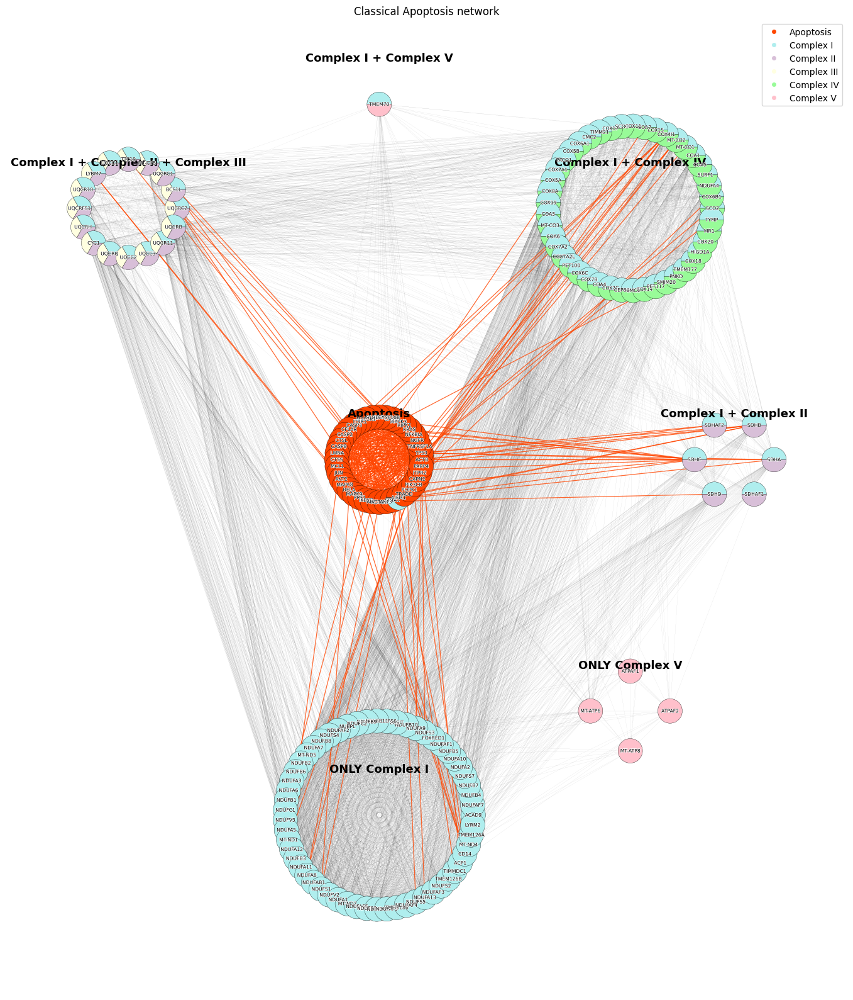

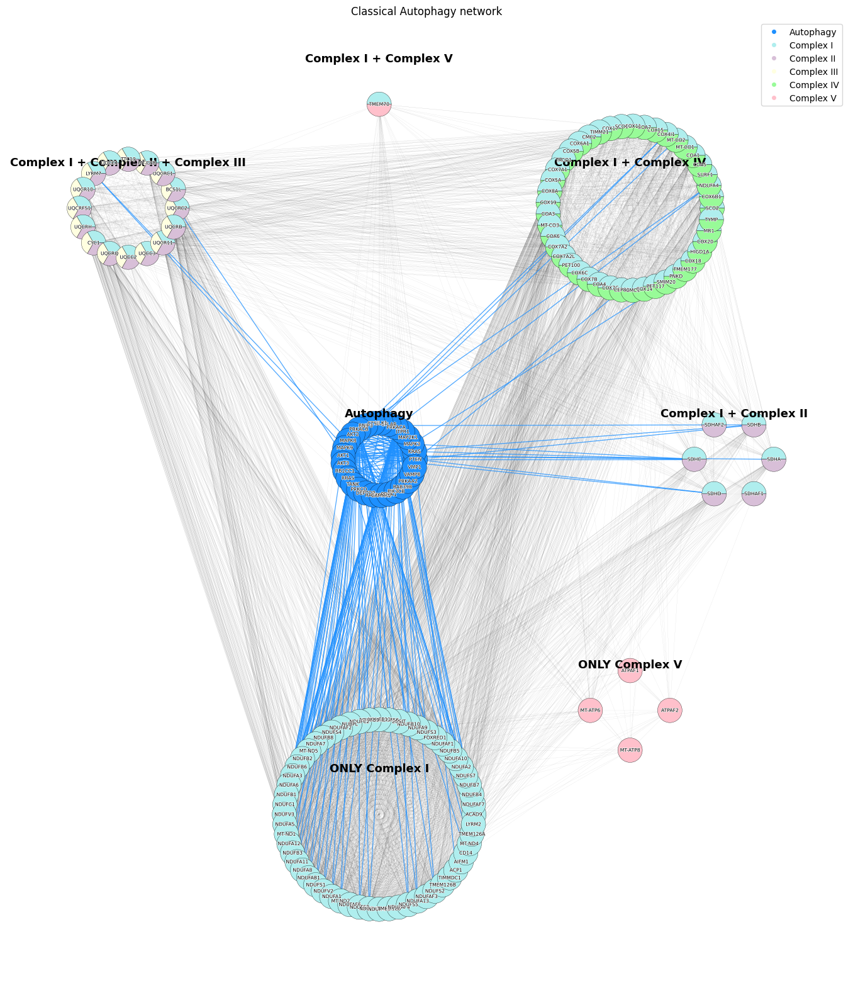

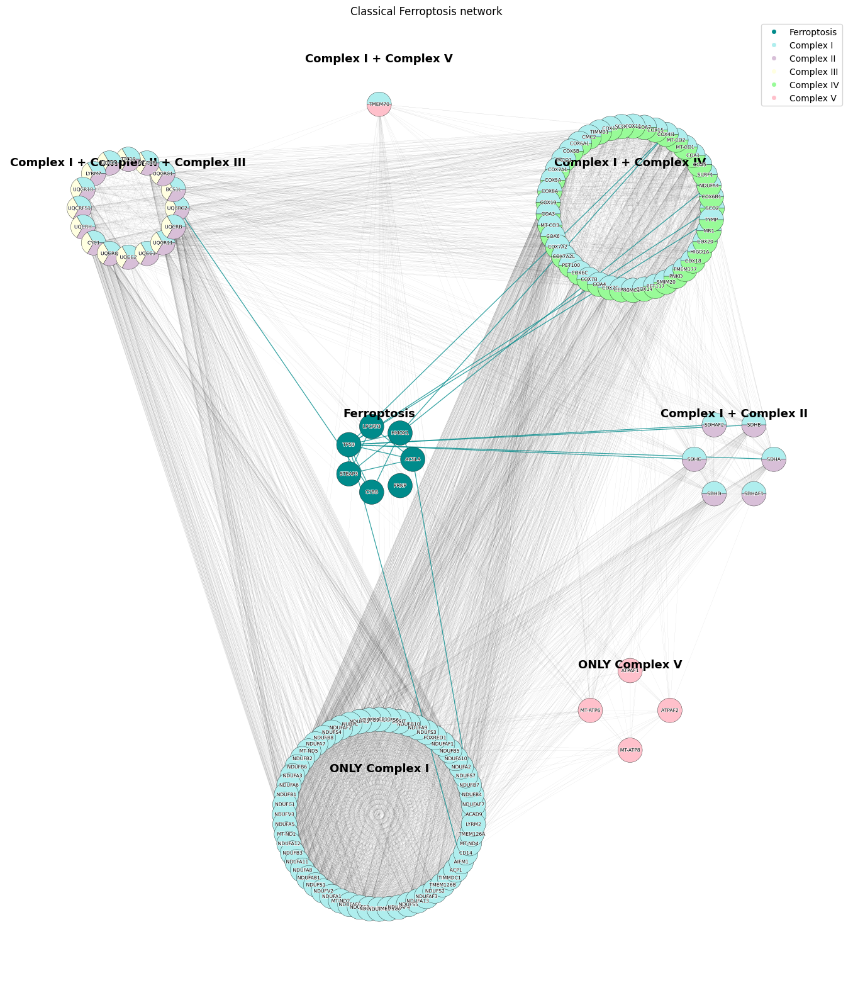

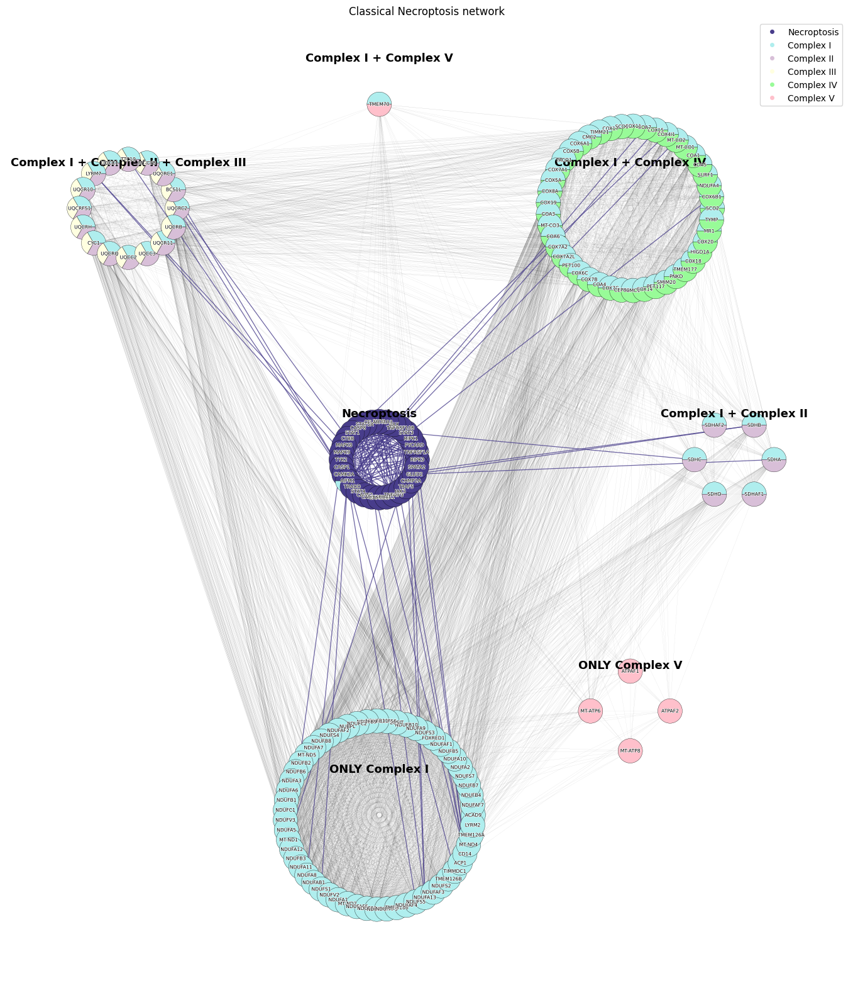

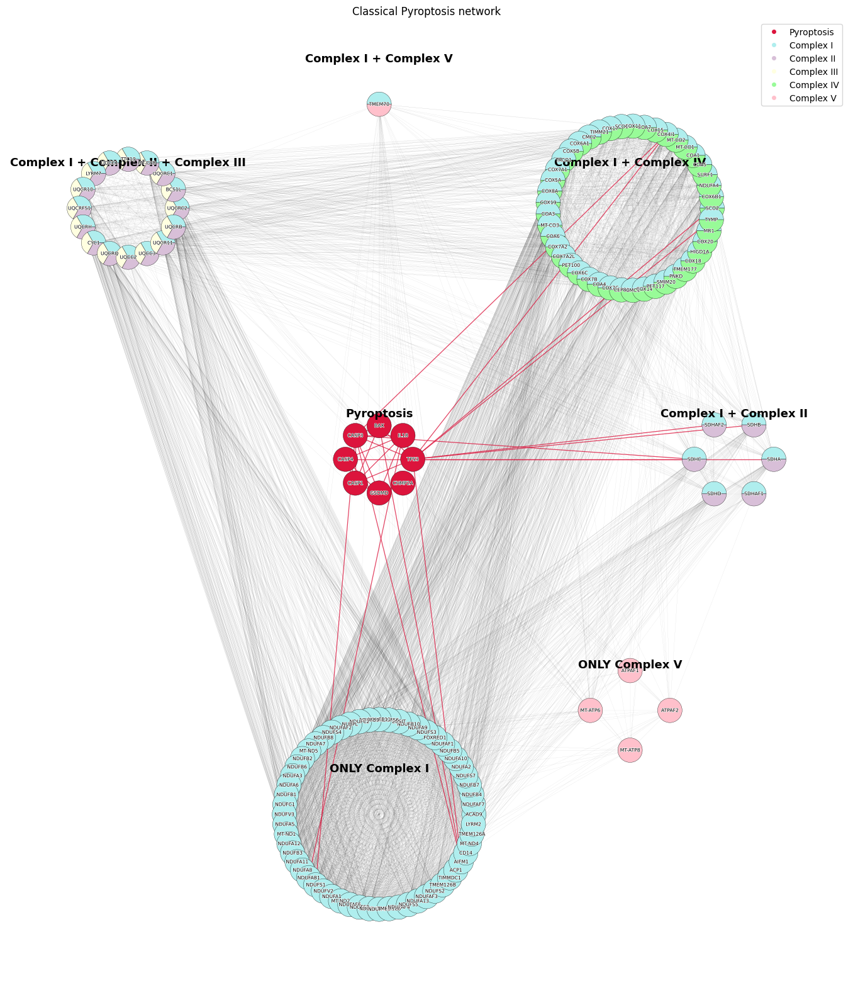

In [27]:
import math
from collections import defaultdict

import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.patches import Circle, Wedge

##############################################
# Choose subtype
##############################################

subtype = "classical"
G = graphs[subtype]

##############################################
# Colours
##############################################

pathway_colors = {
    "Apoptosis": "orangered",
    "Autophagy": "dodgerblue",
    "Ferroptosis": "darkcyan",
    "Necroptosis": "darkslateblue",
    "Pyroptosis": "crimson"
}

complex_colors = {
    "Complex I": "paleturquoise",
    "Complex II": "thistle",
    "Complex III": "lightyellow",
    "Complex IV": "palegreen",
    "Complex V": "pink"
}

complex_order = [
    "Complex I",
    "Complex II",
    "Complex III",
    "Complex IV",
    "Complex V"
 ]

death_pathways = [
    "Apoptosis",
    "Autophagy",
    "Ferroptosis",
    "Necroptosis",
    "Pyroptosis"
 ]

##############################################
# Build memberships
##############################################

def complex_signature(gene):
    return tuple(
        complex_name
        for complex_name in complex_order
        if complex_name in G.nodes[gene]["Complexes"]
    )

def primary_group(gene, center_pathway):
    if center_pathway in G.nodes[gene]["Pathways"]:
        return center_pathway

    signature = complex_signature(gene)
    if signature:
        return signature

    return None

##############################################
# Plot each pathway
##############################################

for center_pathway in death_pathways:

    membership = {}

    for gene in G.nodes():
        group = primary_group(gene, center_pathway)
        if group is not None:
            membership[gene] = group

    nodes_to_plot = set(membership.keys())
    G_plot = G.subgraph(nodes_to_plot).copy()

    membership_groups = defaultdict(list)

    for gene, group in membership.items():
        membership_groups[group].append(gene)

    def group_label(group):
        if group == center_pathway:
            return group
        if isinstance(group, tuple):
            if len(group) == 1:
                return f"ONLY {group[0]}"
            return " + ".join(group)
        return str(group)

    group_centers = {
        center_pathway: (0, 0)
    }

    combo_groups = sorted(
        [group for group in membership_groups if group != center_pathway],
        key=lambda group: (len(group), group) if isinstance(group, tuple) else (99, str(group))
    )

    ring_radii = [5.8, 8.7, 11.2]
    slots_per_ring = 8

    for index, group in enumerate(combo_groups):
        ring_index = index // slots_per_ring
        slot_index = index % slots_per_ring

        ring_radius = ring_radii[min(ring_index, len(ring_radii) - 1)]
        angle = 2 * np.pi * slot_index / slots_per_ring - np.pi / 2

        group_centers[group] = (
            ring_radius * np.cos(angle),
            ring_radius * np.sin(angle)
        )

    pos = {}

    for group, genes in membership_groups.items():
        centre = np.array(group_centers[group])
        n = len(genes)

        if n == 1:
            pos[genes[0]] = tuple(centre)
            continue

        if group == center_pathway:
            r = max(0.55, 0.11 * math.sqrt(n))
        else:
            r = max(0.65, 0.20 * math.sqrt(n))

        angles = np.linspace(0, 2 * np.pi, n, endpoint=False)

        for gene, angle in zip(genes, angles):
            pos[gene] = (
                centre[0] + r * np.cos(angle),
                centre[1] + r * np.sin(angle)
            )

    fig, ax = plt.subplots(figsize=(16, 16))

    for group, (x, y) in group_centers.items():
        ax.text(
            x,
            y + 0.7,
            group_label(group),
            ha="center",
            fontsize=13,
            fontweight="bold"
        )

    red_edges = []
    black_edges = []

    for u, v in G_plot.edges():
        u_is_center = center_pathway in G_plot.nodes[u]["Pathways"]
        v_is_center = center_pathway in G_plot.nodes[v]["Pathways"]

        if u_is_center or v_is_center:
            red_edges.append((u, v))
        else:
            black_edges.append((u, v))

    nx.draw_networkx_edges(
        G_plot,
        pos,
        edgelist=black_edges,
        edge_color="black",
        width=0.03,
        alpha=0.8,
        ax=ax
    )

    nx.draw_networkx_edges(
        G_plot,
        pos,
        edgelist=red_edges,
        edge_color=pathway_colors[center_pathway],
        width=0.9,
        alpha=0.8,
        ax=ax
    )

    node_radius = 0.20

    for gene in G_plot.nodes():
        x, y = pos[gene]

        colours = []

        if center_pathway in G_plot.nodes[gene]["Pathways"]:
            colours.append(pathway_colors[center_pathway])

        for comp in G_plot.nodes[gene]["Complexes"]:
            if comp in complex_colors:
                colours.append(complex_colors[comp])

        if len(colours) == 0:
            ax.add_patch(
                Circle(
                    (x, y),
                    node_radius,
                    facecolor="lightgray",
                    edgecolor="black",
                    linewidth=0.25
                )
            )
        elif len(colours) == 1:
            ax.add_patch(
                Circle(
                    (x, y),
                    node_radius,
                    facecolor=colours[0],
                    edgecolor="black",
                    linewidth=0.25
                )
            )
        else:
            angle = 360 / len(colours)
            for i, colour in enumerate(colours):
                ax.add_patch(
                    Wedge(
                        (x, y),
                        node_radius,
                        theta1=i * angle,
                        theta2=(i + 1) * angle,
                        facecolor=colour,
                        edgecolor="black",
                        linewidth=0.25
                    )
                )

    for gene in G_plot.nodes():
        x, y = pos[gene]
        txt = ax.text(
            x,
            y,
            gene,
            fontsize=5.5,
            ha="center",
            va="center",
            family="sans-serif"
        )
        txt.set_path_effects([
            pe.Stroke(
                linewidth=1,
                foreground="white"
            ),
            pe.Normal()
        ])

    legend = [
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=pathway_colors[center_pathway],
               label=center_pathway),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=complex_colors["Complex I"],
               label='Complex I'),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=complex_colors["Complex II"],
               label='Complex II'),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=complex_colors["Complex III"],
               label='Complex III'),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=complex_colors["Complex IV"],
               label='Complex IV'),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=complex_colors["Complex V"],
               label='Complex V')
    ]

    ax.legend(
        handles=legend,
        loc="upper right"
    )

    ax.set_aspect("equal")
    ax.axis("off")

    plt.title(f"{subtype.capitalize()} {center_pathway} network")

    plt.tight_layout()





In [28]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import networkx as nx

from matplotlib.lines import Line2D
from matplotlib.patches import Circle, Wedge


center_pathway = "Apoptosis"

for subtype in subtypes:


    for pathway in pathways:
        center_pathway = pathway
        
        
        G = graphs[subtype]

        pair_complexes = [
            "Complex I",
            "Complex II",
            "Complex III",
            "Complex IV",
            "Complex V"
        ]

        pathway_colors = {
            "Apoptosis": "orangered",
            "Autophagy": "dodgerblue",
            "Ferroptosis": "darkcyan",
            "Necroptosis": "darkslateblue",
            "Pyroptosis": "crimson"
        }


        complex_colors = {
            "Complex I": "paleturquoise",
            "Complex II": "thistle",
            "Complex III": "lightyellow",
            "Complex IV": "palegreen",
            "Complex V": "pink"
        }

        radius = 0.02

        for complex_name in pair_complexes:
            
            ##################################################
            # Keep ONLY:
            #   - apoptosis genes
            #   - selected complex genes
            ##################################################

            nodes_to_plot = [
                gene
                for gene in G.nodes()
                if (
                    center_pathway in G.nodes[gene]["Pathways"]
                    or
                    complex_name in G.nodes[gene]["Complexes"]
                )
            ]

            G_plot = G.subgraph(nodes_to_plot).copy()
            import matplotlib as mpl

            log2fcs = [
                G_plot.nodes[g]["log2FC"]
                for g in G_plot.nodes()
            ]

            fc_norm = mpl.colors.TwoSlopeNorm(
                vmin=min(log2fcs),
                vcenter=0,
                vmax=max(log2fcs)
            )

            fc_cmap = plt.cm.coolwarm
        
            sm_fc = mpl.cm.ScalarMappable(
                cmap=fc_cmap,
                norm=fc_norm
            )
            sm_fc.set_array([])



            ##################################################
            # Layout
            ##################################################

            pos = nx.kamada_kawai_layout(G_plot)

            fig, ax = plt.subplots(figsize=(14,14))

            ax.set_aspect("equal", adjustable="box")
            
            ##################################################
            # Edges colored by STRING confidence
            ##################################################

            from mpl_toolkits.axes_grid1 import make_axes_locatable
            import matplotlib as mpl

            scores = [
                G_plot[u][v]["combined_score"]
                for u, v in G_plot.edges()
            ]

            vmin = min(scores)
            vmax = max(scores)

            nx.draw_networkx_edges(
                G_plot,
                pos,
                edge_color=scores,
                edge_cmap=plt.cm.viridis_r,
                edge_vmin=vmin,
                edge_vmax=vmax,
                width=1,
                alpha=0.8,
                ax=ax
            )


            ##################################################
            # STRING score colorbar
            ##################################################

            import matplotlib as mpl

            norm = mpl.colors.Normalize(
                vmin=vmin,
                vmax=vmax
            )

            sm = mpl.cm.ScalarMappable(
                cmap=plt.cm.viridis_r,
                norm=norm
            )
            sm.set_array([])

            # left colorbar
            cax1 = fig.add_axes([1.08, 0.15, 0.02, 0.70])

            cbar = fig.colorbar(
                sm,
                cax=cax1
            )

            cbar.set_label(
                "STRING combined score",
                fontsize=11
            )

            ##################################################
            # log2FC colorbar
            ##################################################

            fc_norm = mpl.colors.TwoSlopeNorm(
                vmin=min(log2fcs),
                vcenter=0,
                vmax=max(log2fcs)
            )

            fc_cmap = plt.cm.coolwarm

            sm_fc = mpl.cm.ScalarMappable(
                cmap=fc_cmap,
                norm=fc_norm
            )
            sm_fc.set_array([])

            # second colorbar further left
            cax2 = fig.add_axes([1.02, 0.15, 0.02, 0.70])

            cbar_fc = fig.colorbar(
                sm_fc,
                cax=cax2
            )

            cbar_fc.set_label(
                r"$\log_2$ fold change",
                fontsize=11
            )
            ##################################################
            # Nodes
            ##################################################


            

            for gene in G_plot.nodes():

                x, y = pos[gene]

                fill = fc_cmap(
                    fc_norm(G_plot.nodes[gene]["log2FC"])
                )

                apoptosis = center_pathway in G_plot.nodes[gene]["Pathways"]
                complex_member = complex_name in G_plot.nodes[gene]["Complexes"]

                # outline color
                if apoptosis and complex_member:
                    edgecolor = "black"      # both
                elif apoptosis:
                    edgecolor = pathway_colors[center_pathway]
                elif complex_member:
                    edgecolor = complex_colors[complex_name]
                else:
                    edgecolor = "lightgray"

                ax.add_patch(
                    Circle(
                        (x, y),
                        radius,
                        facecolor=fill,
                        edgecolor=edgecolor,
                        linewidth=1.8
                    )
                )


            ##################################################
            # Labels
            ##################################################

            label_pos = {
                gene: (xy[0] + 0.03, xy[1] + 0.02)
                for gene, xy in pos.items()
            }

            texts = nx.draw_networkx_labels(
                G_plot,
                label_pos,
                labels={g: g for g in G_plot.nodes()},
                font_size=7,
                font_family="sans-serif",
                font_color="black",
                ax=ax
            )

            for t in texts.values():

                t.set_path_effects([
                    pe.Stroke(
                        linewidth=1.2,
                        foreground="white"
                    ),
                    pe.Normal()
                ])

            ##################################################
            # Legend
            ##################################################

            legend = [

                Line2D(
                    [0], [0],
                    marker="o",
                    color="w",
                    markerfacecolor=pathway_colors[center_pathway],
                    label=center_pathway
                ),

                Line2D(
                    [0], [0],
                    marker="o",
                    color="w",
                    markerfacecolor=complex_colors[complex_name],
                    label=complex_name
                ),

                Line2D(
                    [0], [0],
                    marker="o",
                    color="w",
                    markerfacecolor="white",
                    markeredgecolor="black",
                    label=f"{center_pathway} + {complex_name}"
                )

            ]

            ax.legend(
                handles=legend,
                loc="upper right"
            )

            ##################################################
            # Finish
            ##################################################

            ax.set_title(
                f"{subtype.capitalize()} : {center_pathway} vs {complex_name}",
                fontsize=16,
                fontweight="bold"
            )

            ax.axis("off")

            plt.tight_layout()

            plt.savefig(
                f"../data/interim/network_stat/{subtype}/{center_pathway.lower()}/{subtype}_{center_pathway.lower()}_{complex_name.lower().replace(' ', '_')}.svg",
                format="svg",
                bbox_inches="tight"
            )

            plt.close(fig)
            #plt.show()

C:\Users\haina\AppData\Local\Temp\ipykernel_8324\69492238.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
